prep time: 4.328811168670654 
matching: 0.6060867309570312


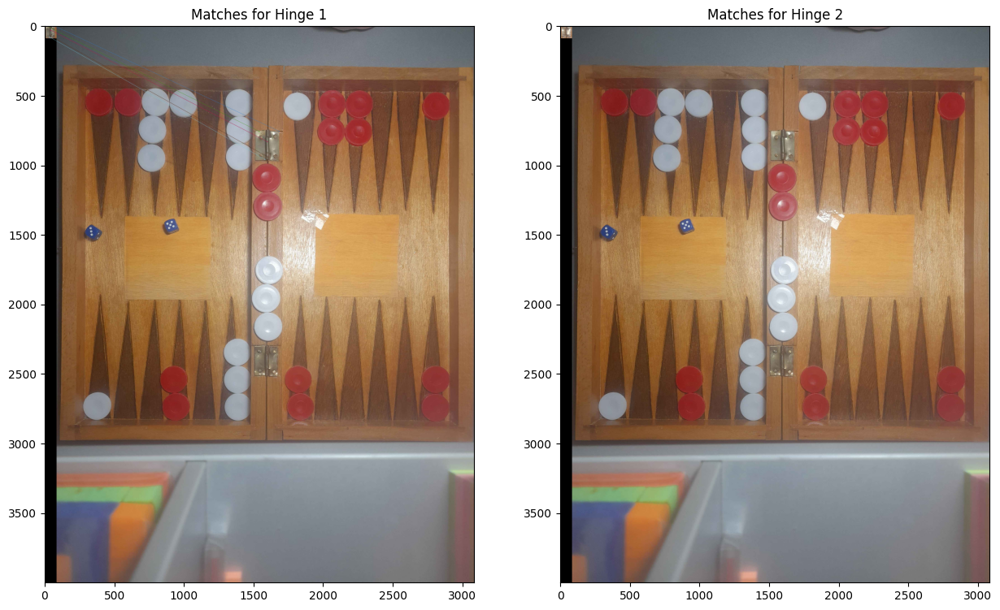

In [1]:
import cv2
import matplotlib.pyplot as plt
import time
import numpy as np

start_prep = time.time()
# Load the template (hinge) and scene images
template1 = cv2.imread('hinges/hinge1.png', cv2.IMREAD_COLOR)  # First hinge
template2 = cv2.imread('hinges/hinge2.png', cv2.IMREAD_COLOR)  # Second hinge
template1 = cv2.cvtColor(template1, cv2.COLOR_BGR2RGB)
template2 = cv2.cvtColor(template2, cv2.COLOR_BGR2RGB)
# scene = cv2.imread('cropped/1.jpg', cv2.IMREAD_COLOR)       # Larger image
scene = cv2.imread('uncropped/2.png', cv2.IMREAD_COLOR)       # Larger image
scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors in templates and the scene
keypoints1, descriptors1 = sift.detectAndCompute(template1, None)
keypoints2, descriptors2 = sift.detectAndCompute(template2, None)
scene_keypoints, scene_descriptors = sift.detectAndCompute(scene, None)
prep_done = time.time()

# Use FLANN-based matcher for faster and more robust matching
index_params = dict(algorithm=1, trees=5)  # KD-Tree algorithm
search_params = dict(checks=50)  # Number of checks in KD-tree
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Match template1
matches1 = flann.knnMatch(descriptors1, scene_descriptors, k=2)

# Match template2
matches2 = flann.knnMatch(descriptors2, scene_descriptors, k=2)

# Apply Lowe's ratio test to filter good matches
good_matches1 = [m for m, n in matches1 if m.distance < 0.7 * n.distance]
good_matches2 = [m for m, n in matches2 if m.distance < 0.7 * n.distance]

# Draw the matches
matched_image1 = cv2.drawMatchesKnn(template1, keypoints1, scene, scene_keypoints, [good_matches1], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
matched_image2 = cv2.drawMatchesKnn(template2, keypoints2, scene, scene_keypoints, [good_matches2], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

print("prep time:", prep_done-start_prep, "\nmatching:", time.time()-prep_done)
# Show the results
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.title("Matches for Hinge 1")
plt.imshow(matched_image1, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Matches for Hinge 2")
plt.imshow(matched_image2, cmap='gray')

plt.show()


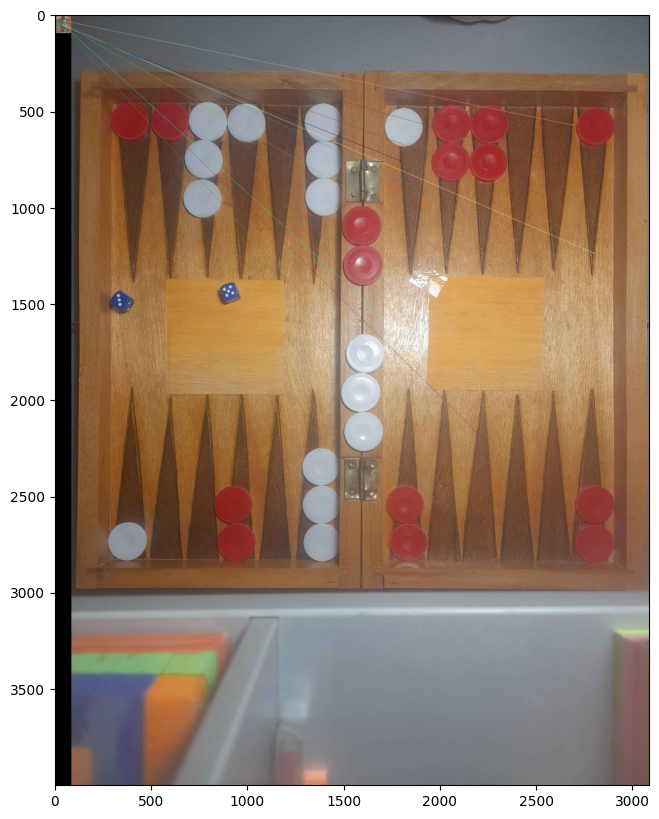

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load query (hinge image) and target image
query_image = template1
target_image = scene

# Initialize the FAST detector
fast = cv2.FastFeatureDetector_create()

# Detect keypoints in both query and target images using FAST
keypoints_query = fast.detect(query_image, None)
keypoints_target = fast.detect(target_image, None)

# Now, use BRIEF or ORB to extract descriptors from the FAST keypoints
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
# Alternatively, you can use ORB descriptors as well
# orb = cv2.ORB_create()

# Compute BRIEF descriptors for the keypoints
keypoints_query, descriptors_query = brief.compute(query_image, keypoints_query)
keypoints_target, descriptors_target = brief.compute(target_image, keypoints_target)

# Match descriptors using Brute Force Matcher (BFMatcher)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)  # For BRIEF, we use Hamming distance

matches = bf.match(descriptors_query, descriptors_target)

# Sort matches by distance (the lower the distance, the better the match)
matches = sorted(matches, key = lambda x: x.distance)

# Draw the top 10 matches
img_matches = cv2.drawMatches(query_image, keypoints_query, target_image, keypoints_target, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the result
plt.figure(figsize=(10, 10))
plt.imshow(img_matches)
plt.show()


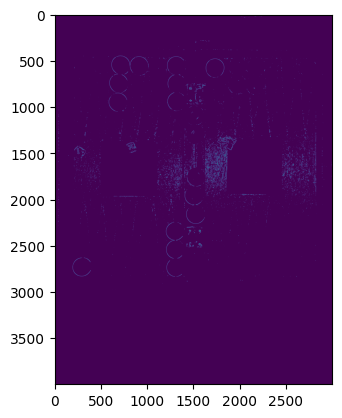

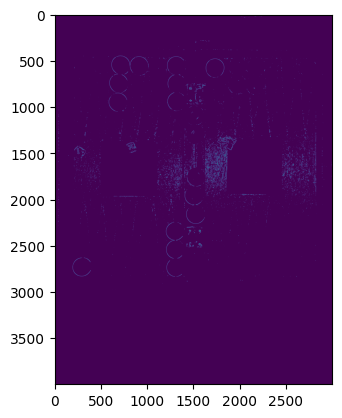

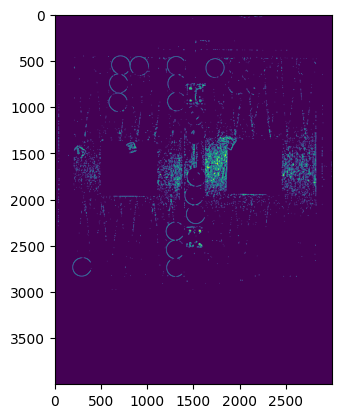

In [45]:
edges = cv2.Canny(scene,250,250)
plt.imshow(edges)
plt.show()
tresholded = np.zeros_like(edges)
t = np.max(edges)*0.75
tresholded[edges > t] = 1
plt.imshow(tresholded)
plt.show()
dilated = tresholded
dilated = cv2.dilate(tresholded, np.ones((3,3)))
plt.imshow(dilated)
plt.show()

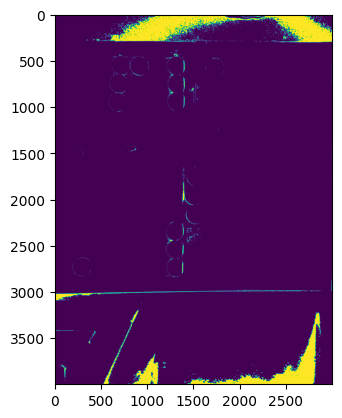

In [46]:
color_discrimination = np.zeros(scene.shape[:2], dtype=np.uint8)  # Only height and width dimensions
# Check the condition for all three channels
epsilon = 15
base = 110
mask = np.all((scene >= base-epsilon) & (scene <= base+epsilon), axis=-1)

# Assign 1 to positions that meet the condition
color_discrimination[mask] = 1
plt.imshow(color_discrimination)
plt.show()

In [53]:
scene.shape

(4000, 3000, 3)

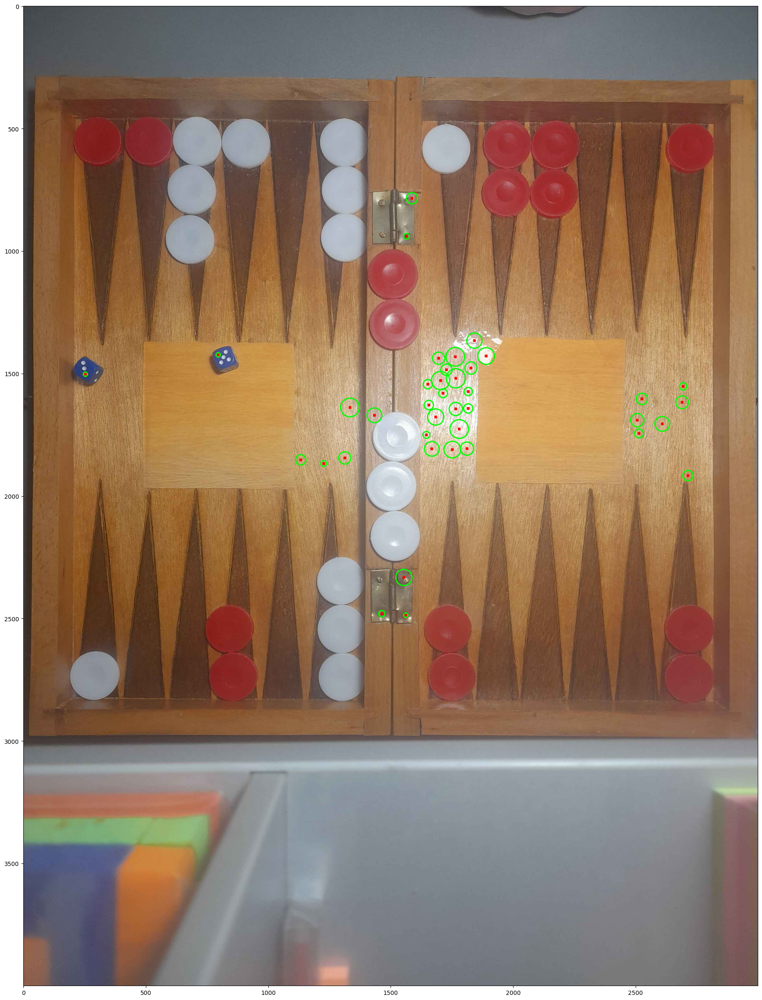

In [81]:
import cv2
import numpy as np

# Load the image
image = scene.copy()
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Apply Gaussian Blur to reduce noise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

# Detect circles using HoughCircles
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=50,
                           param1=50, param2=30, minRadius=1, maxRadius=40)

# If circles are detected, draw them on the image
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    for (x, y, r) in circles:
        cv2.circle(image, (x, y), r, (0, 255, 0), 4)  # Circle
        cv2.rectangle(image, (x - 5, y - 5), (x + 5, y + 5), (255, 0, 0), -1)  # Center

# Display the output
plt.figure(figsize=(30,30))
plt.imshow(image)
plt.show()
# cv2.destroyAllWindows()


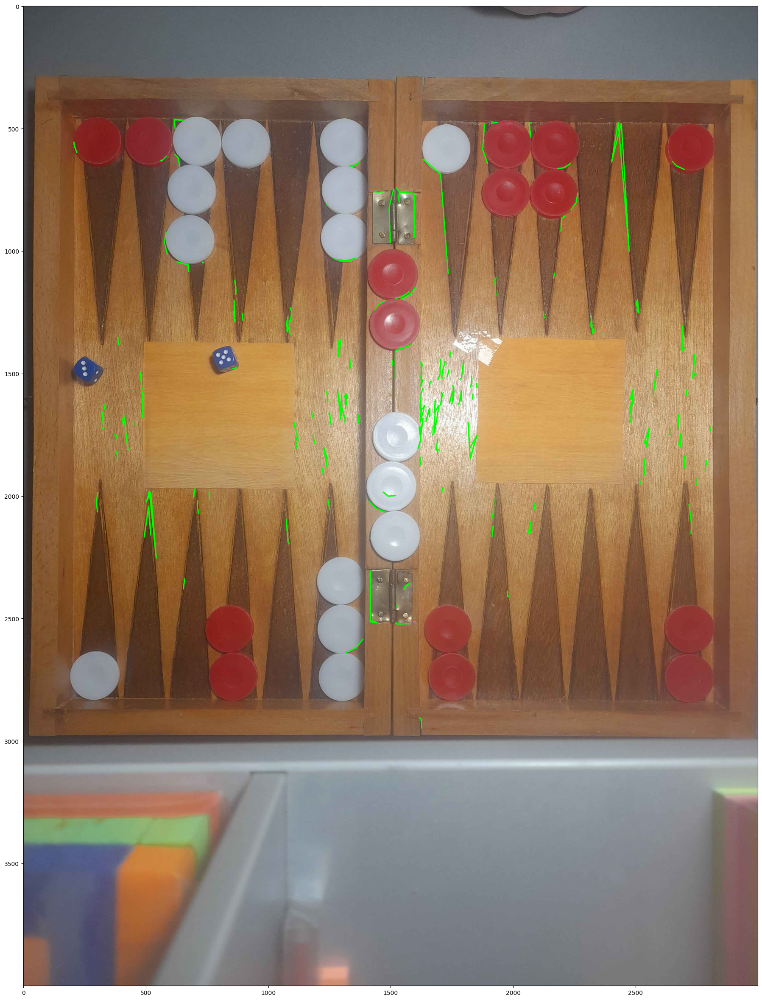

In [48]:
import cv2

# Load the image
image = scene.copy()
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Preprocess: Blur and Edge Detection
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
edges = cv2.Canny(blurred, 50, 150)

# Find contours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Loop through contours and identify rectangles
for contour in contours:
    # Approximate the contour
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Check if it is a rectangle (4 sides)
    if len(approx) == 4:
        # Draw the rectangle
        cv2.drawContours(image, [approx], -1, (0, 255, 0), 3)

# Display the output
plt.figure(figsize=(30,30))
plt.imshow(image)
plt.show()

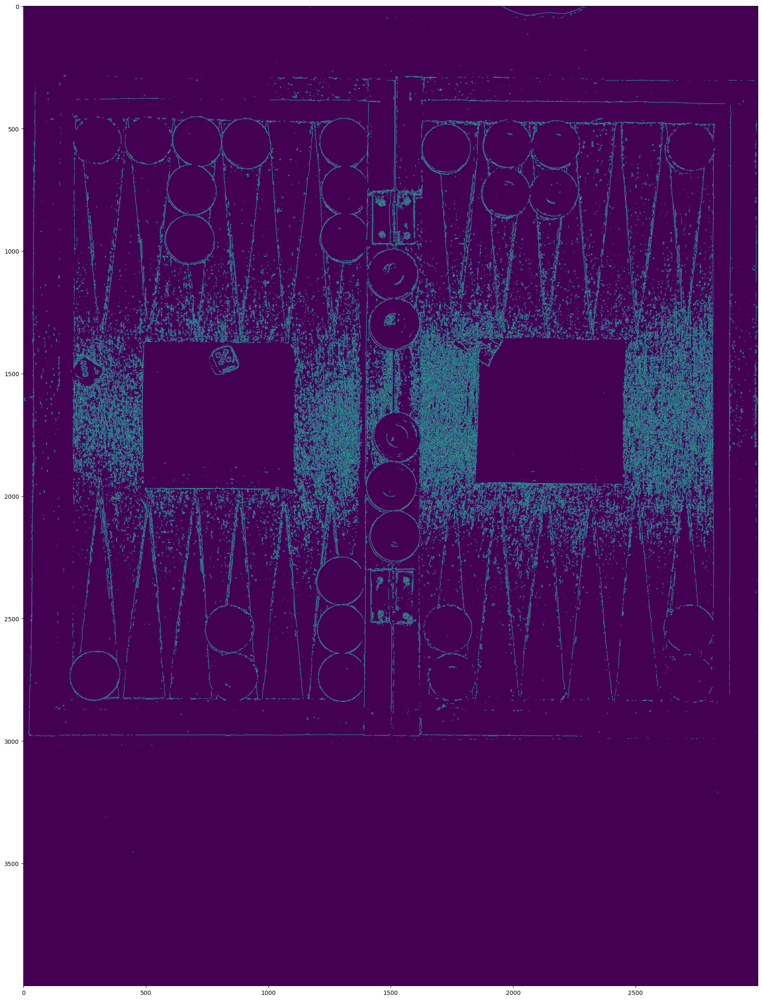

In [64]:
canny = cv2.Canny(scene,100,100)
plt.figure(figsize=(30,30))
plt.imshow(canny)
plt.show()

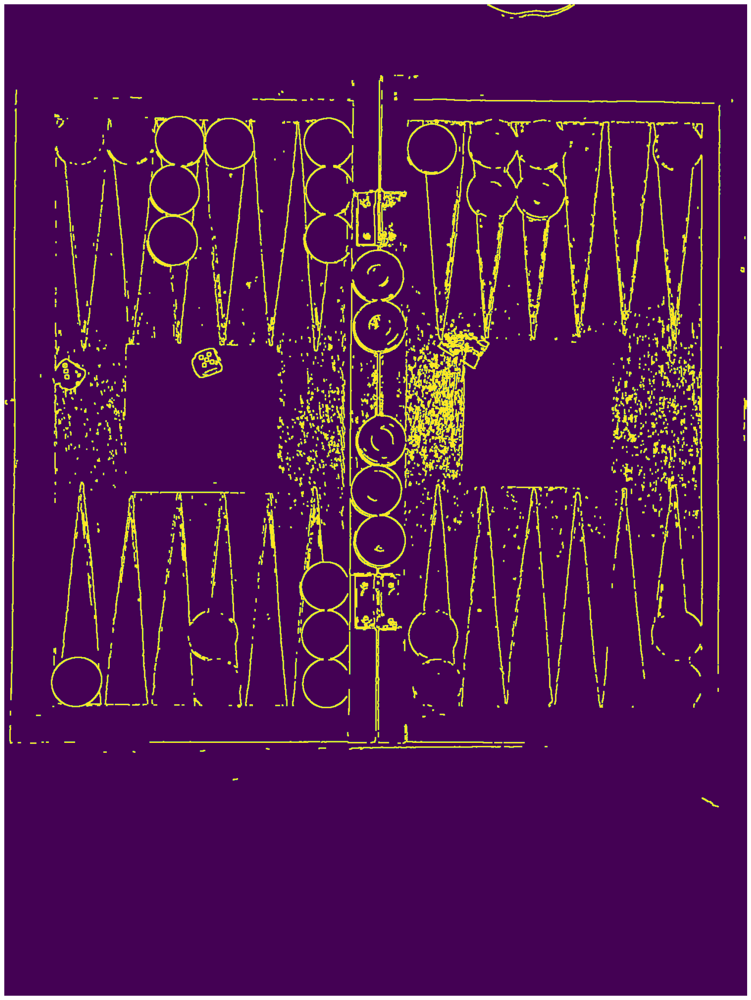

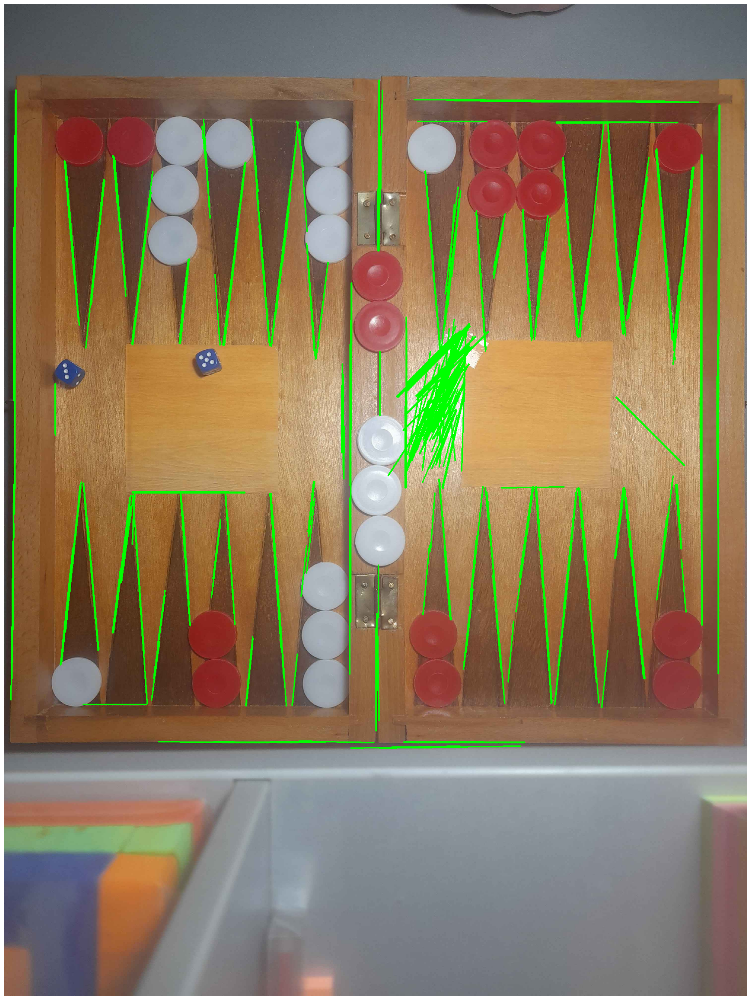

In [91]:
import cv2
import numpy as np

# Load the image
image = scene.copy()
image = cv2.resize(image, dsize=(1500, 2000), interpolation=cv2.INTER_CUBIC)
# gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# # Apply Gaussian blur to reduce noise
# blurred = cv2.GaussianBlur(gray, (5, 5), 1)

# # Use Canny edge detector
# edges = cv2.Canny(blurred, threshold1=70, threshold2=80)

R, G, B = cv2.split(image)

# Apply Canny edge detector to each channel separately
edges_R = cv2.Canny(cv2.GaussianBlur(R, (5, 5), 0), threshold1=70, threshold2=80)
edges_G = cv2.Canny(cv2.GaussianBlur(G, (5, 5), 0), threshold1=70, threshold2=80)
edges_B = cv2.Canny(cv2.GaussianBlur(B, (5, 5), 0), threshold1=70, threshold2=80)

# Combine the edges from each channel by summing them
edges_combined = cv2.bitwise_or(edges_R, cv2.bitwise_or(edges_G, edges_B))

dilated = cv2.dilate(edges, np.ones((3,3)), iterations=1)

# Use Hough Line Transform to detect straight lines
lines = cv2.HoughLinesP(dilated, rho=1, theta=np.pi/180, threshold=140, minLineLength=100, maxLineGap=10)

# Draw the detected lines on the original image
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,30))
plt.imshow(dilated)
plt.axis('off')  # Turn off axis for better viewing
plt.show()
# Display the image with matplotlib
plt.figure(figsize=(30,30))
plt.imshow(image)
plt.axis('off')  # Turn off axis for better viewing
plt.show()

